In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df = pd.read_csv(r'/Users/gokul/My Apple/vs_code_practice/retail_sales_forecast/combined_clean_dataset.csv')
df

,Store,Type,Dept,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,IsMarkup,Week_Number,IsHoliday,CPI,Unemployment,Day,Month,Year,Weekly_Sales
0,1,A,1,151315,42.31,2.572,20522.5677,3916.1645,216.3458,19570.7064,8460.3097,0,5,No Holiday,211.096358,8.106000,5,2,2010,24924.5000
1,1,A,2,151315,42.31,2.572,20522.5677,3916.1645,216.3458,19570.7064,8460.3097,0,5,No Holiday,211.096358,8.106000,5,2,2010,50605.2700
2,1,A,3,151315,42.31,2.572,20522.5677,3916.1645,216.3458,19570.7064,8460.3097,0,5,No Holiday,211.096358,8.106000,5,2,2010,13740.1200
3,1,A,4,151315,42.31,2.572,20522.5677,3916.1645,216.3458,19570.7064,8460.3097,0,5,No Holiday,211.096358,8.106000,5,2,2010,39954.0400
4,1,A,5,151315,42.31,2.572,20522.5677,3916.1645,216.3458,19570.7064,8460.3097,0,5,No Holiday,211.096358,8.106000,5,2,2010,32229.3800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536629,45,B,93,118221,76.06,3.804,212.0200,851.7300,2.0600,10.8800,1864.5700,0,30,No Holiday,193.491386,8.590008,26,7,2013,3391.6125
536630,45,B,94,118221,76.06,3.804,212.0200,851.7300,2.0600,10.8800,1864.5700,0,30,No Holiday,193.491386,8.590008,26,7,2013,4029.5197
536631,45,B,95,118221,76.06,3.804,212.0200,851.7300,2.0600,10.8800,1864.5700,0,30,No Holiday,193.491386,8.590008,26,7,2013,57285.5943
536632,45,B,97,118221,76.06,3.804,212.0200,851.7300,2.0600,10.8800,1864.5700,0,30,No Holiday,193.491386,8.590008,26,7,2013,5697.8791


In [3]:
df.isna().sum()

Store           0
Type            0
Dept            0
Size            0
Temperature     0
Fuel_Price      0
MarkDown1       0
MarkDown2       0
MarkDown3       0
MarkDown4       0
MarkDown5       0
IsMarkup        0
Week_Number     0
IsHoliday       0
CPI             0
Unemployment    0
Day             0
Month           0
Year            0
Weekly_Sales    0
dtype: int64

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,536634.0,22.208621,12.790580,1.000,11.000,22.000000,33.00000,45.000000
Dept,536634.0,44.277301,30.527358,1.000,18.000,37.000000,74.00000,99.000000
Size,536634.0,136678.550960,61007.711800,34875.000,93638.000,140167.000000,202505.00000,219622.000000
Temperature,536634.0,58.771762,18.678716,-7.290,45.250,60.060000,73.23000,101.950000
Fuel_Price,536634.0,3.408310,0.430861,2.472,3.041,3.523000,3.74400,4.468000
MarkDown1,536634.0,7508.059820,7604.673913,-2781.450,2992.040,6139.820000,9769.27100,103184.980000
MarkDown2,536634.0,2543.692843,7278.498783,-265.760,57.610,385.678000,1604.52470,104519.540000
MarkDown3,536634.0,1317.385122,9268.229491,-179.260,17.070,104.620000,192.18660,149483.310000
MarkDown4,536634.0,3419.613536,5685.365947,0.000,375.750,1778.830000,3944.04130,67474.850000
MarkDown5,536634.0,5529.619967,10503.355088,-185.170,2394.070,4405.900000,6941.94000,771448.100000


## EDA

In [5]:
df.Store.nunique()

45

In [6]:
df.Store.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45])

In [7]:
df.Dept.nunique()

81

In [8]:
df.Dept.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 40, 41, 42, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56,
       58, 59, 60, 67, 71, 72, 74, 79, 80, 81, 82, 83, 85, 87, 90, 91, 92,
       93, 94, 95, 97, 98, 78, 96, 99, 39, 77, 50, 43, 65])

We have 45 stores data totally. Store numbers are from 1 to 45.

In Dept we have 81 departments, and the numbers vary from 1 to 99 with some numbers missing.

In total we have 81 departments in 45 stores. Departments are not same in all the stores.

In [9]:
df.Type.value_counts()

Type
A    274191
B    207995
C     54448
Name: count, dtype: int64

In [10]:
type_fig = px.pie(names = df['Type'].unique(), values = df['Type'].value_counts(), title = 'Store Type Value Counts',
                  height = 500, width = 600)
type_fig

In [11]:
fig = px.box(df, x = 'Type', y = 'Size', color = 'Type')

fig.update_layout(
    height = 500, width = 1200,
    title_text = "Store Size by Type",  # title of plot
    xaxis_title_text = "Type",  # x-axis label
    yaxis_title_text = "Size",  # y-axis label
)

fig.show()

Store A is in more number followed by B and then C.

By the means of Area also, Store A is larger in size followed  y B and then C has the minimum area.

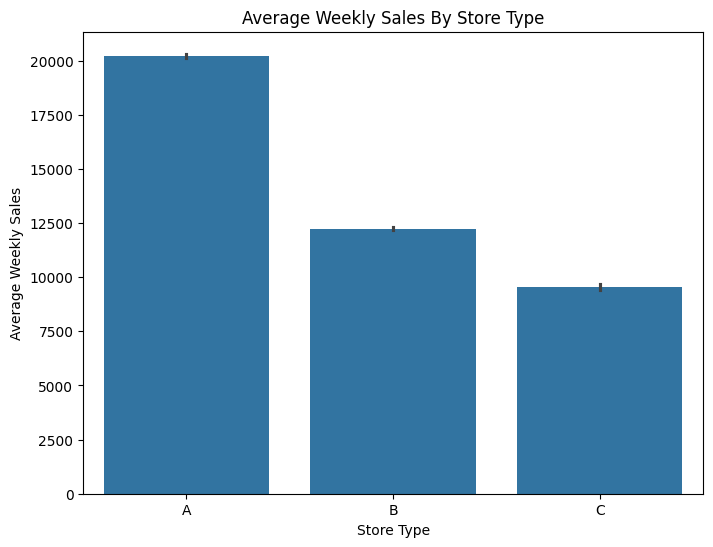

In [12]:
plt.figure(figsize = (8,6))
sns.barplot(df, x = 'Type', y = 'Weekly_Sales')
plt.title('Average Weekly Sales By Store Type')
plt.xlabel('Store Type')
plt.ylabel('Average Weekly Sales')
plt.show()

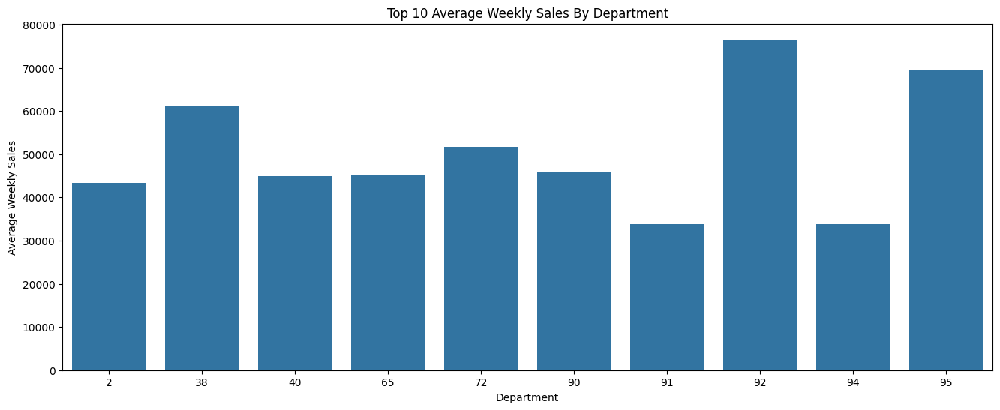

In [14]:
top10_dept = pd.pivot_table(df, values = "Weekly_Sales", index = "Dept").sort_values(by = 'Weekly_Sales', ascending = False)
top10 =top10_dept.head(10)


plt.figure(figsize = (16,6))
sns.barplot(top10, x = top10.index, y = 'Weekly_Sales')
plt.title('Top 10 Average Weekly Sales By Department')
plt.xlabel('Department')
plt.ylabel('Average Weekly Sales')
plt.show()

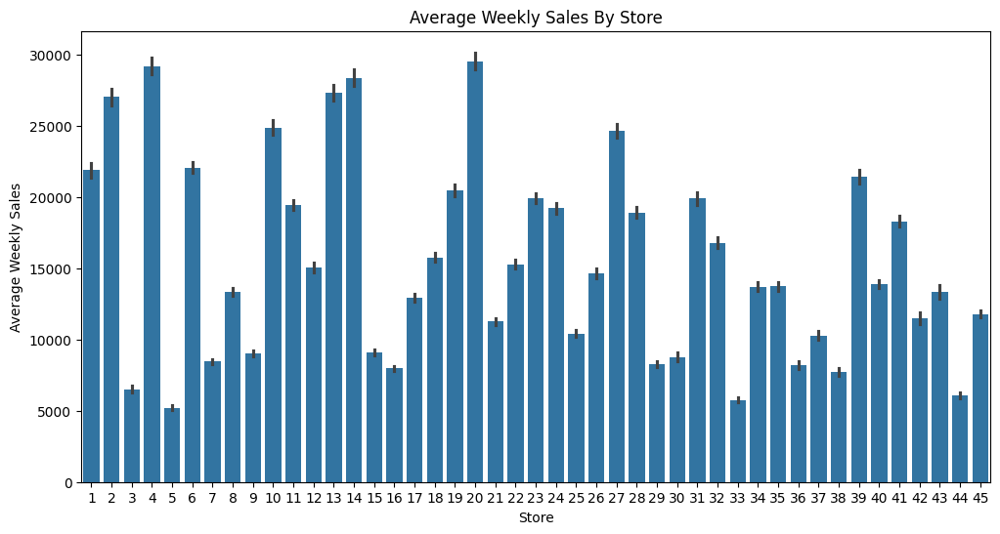

In [15]:
plt.figure(figsize = (12,6))
sns.barplot(df, x = 'Store', y = 'Weekly_Sales')
plt.title('Average Weekly Sales By Store')
plt.xlabel('Store')
plt.ylabel('Average Weekly Sales')
plt.show()

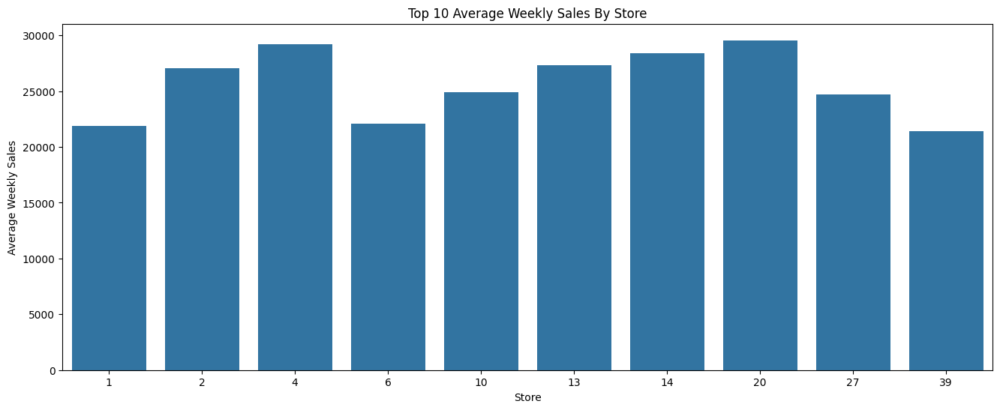

In [17]:
top10_store = pd.pivot_table(df, values = "Weekly_Sales", index = "Store").sort_values(by = 'Weekly_Sales', ascending = False)
top10 = top10_store.head(10)


plt.figure(figsize = (16,6))
sns.barplot(top10, x = top10.index, y = 'Weekly_Sales')
plt.title('Top 10 Average Weekly Sales By Store')
plt.xlabel('Store')
plt.ylabel('Average Weekly Sales')
plt.show()

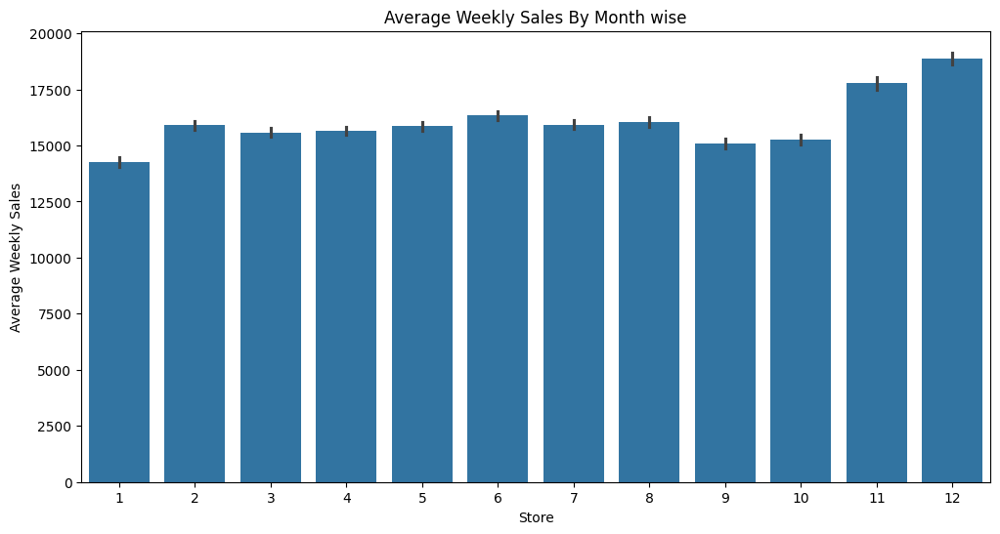

In [18]:
plt.figure(figsize = (12,6))
sns.barplot(df, x = 'Month', y = 'Weekly_Sales')
plt.title('Average Weekly Sales By Month wise')
plt.xlabel('Store')
plt.ylabel('Average Weekly Sales')
plt.show()

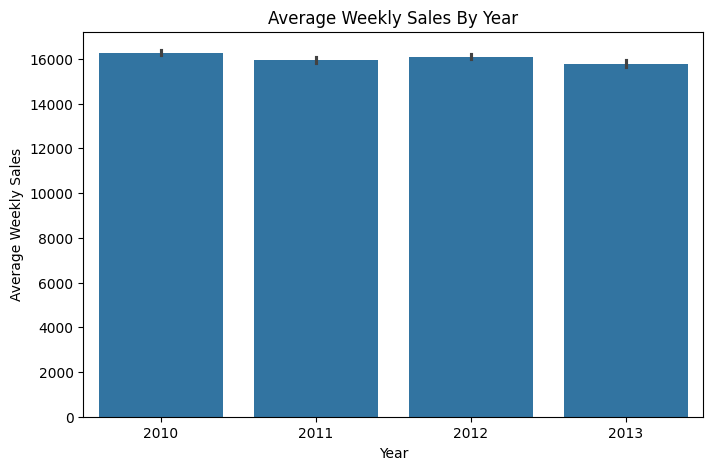

In [19]:
plt.figure(figsize = (8,5))
sns.barplot(df, x = 'Year', y = 'Weekly_Sales')
plt.title('Average Weekly Sales By Year')
plt.xlabel('Year')
plt.ylabel('Average Weekly Sales')
plt.show()

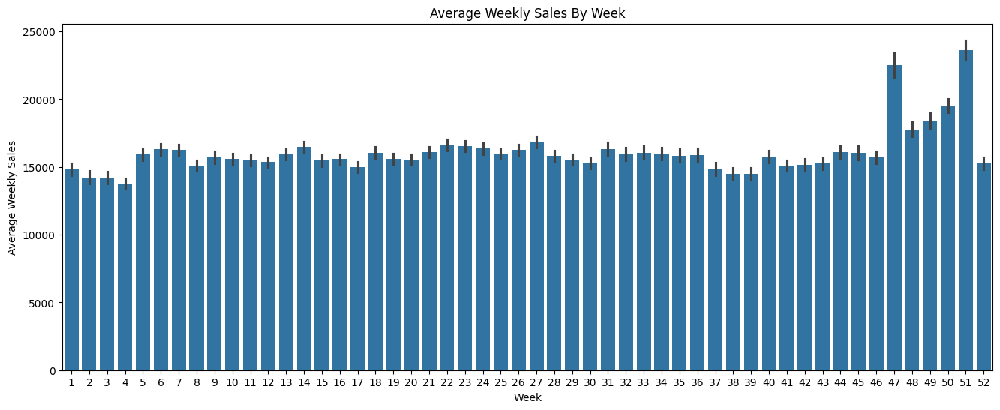

In [20]:
plt.figure(figsize = (16,6))
sns.barplot(df, x = 'Week_Number', y = 'Weekly_Sales')
plt.title('Average Weekly Sales By Week')
plt.xlabel('Week')
plt.ylabel('Average Weekly Sales')
plt.show()

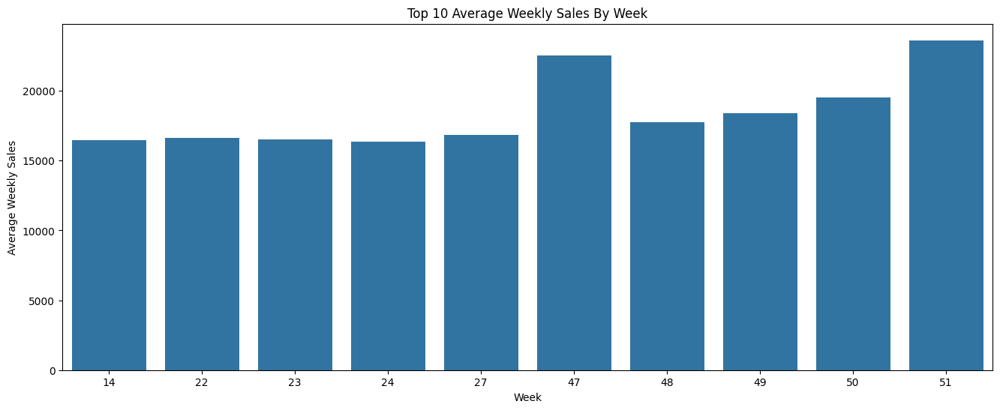

In [21]:
top10_week = pd.pivot_table(df, values = "Weekly_Sales", index = "Week_Number").sort_values(by = 'Weekly_Sales', ascending = False)
top10_week = top10_week.head(10)


plt.figure(figsize = (16,6))
sns.barplot(top10_week, x = top10_week.index, y = 'Weekly_Sales')
plt.title('Top 10 Average Weekly Sales By Week')
plt.xlabel('Week')
plt.ylabel('Average Weekly Sales')
plt.show()

In [23]:
df['IsHoliday'] = np.where(df['Week_Number'] == 6, 'Super Bowl',
                                    np.where(df['Week_Number'] == 36, 'Labor Day',
                                    np.where(df['Week_Number'] == 47, 'Thanksgiving',
                                    np.where(df['Week_Number'] == 51, 'Christmas',  'No Holiday'))))

In [24]:
df['IsHoliday'].value_counts()

IsHoliday
No Holiday      497994
Super Bowl       11859
Christmas         8985
Thanksgiving      8935
Labor Day         8861
Name: count, dtype: int64

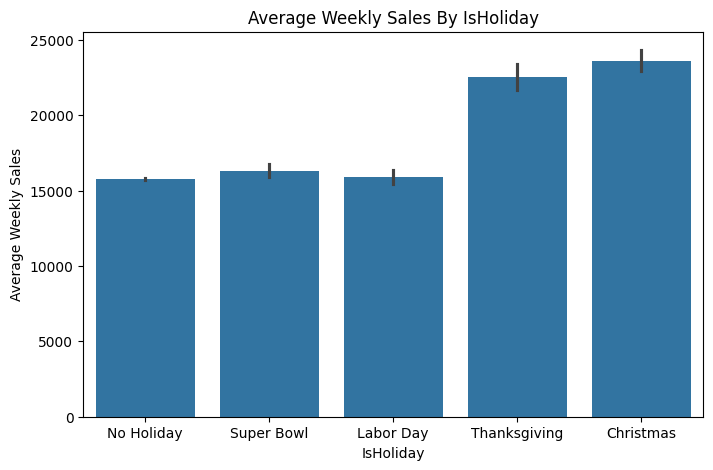

In [25]:
plt.figure(figsize = (8,5))
sns.barplot(df, x = 'IsHoliday', y = 'Weekly_Sales')
plt.title('Average Weekly Sales By IsHoliday')
plt.xlabel('IsHoliday')
plt.ylabel('Average Weekly Sales')
plt.show()

<Axes: xlabel='Week_Number'>

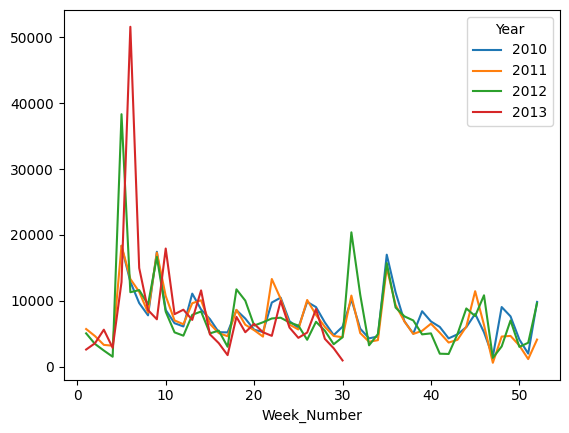

In [26]:
markdown1 = pd.pivot_table(df, values = "MarkDown1", columns = "Year", index = "Week_Number")
markdown1.plot()

<Axes: xlabel='Week_Number'>

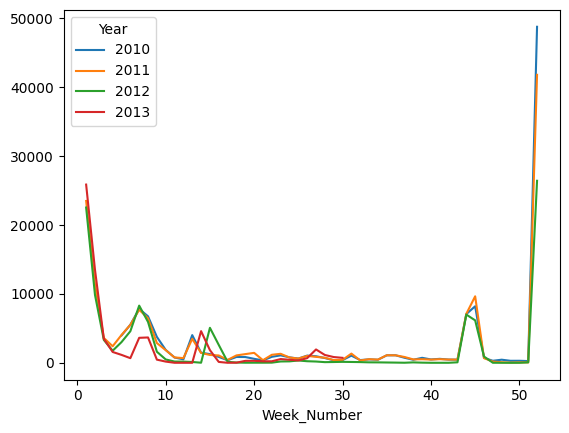

In [27]:
markdown2 = pd.pivot_table(df, values = "MarkDown2", columns = "Year", index = "Week_Number")
markdown2.plot()

<Axes: xlabel='Week_Number'>

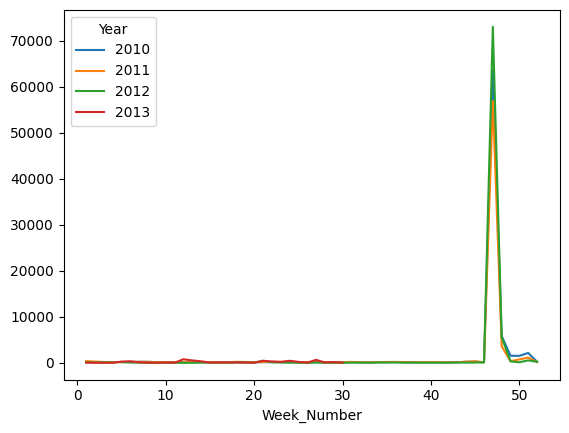

In [28]:
markdown3 = pd.pivot_table(df, values = "MarkDown3", columns = "Year", index = "Week_Number")
markdown3.plot()

<Axes: xlabel='Week_Number'>

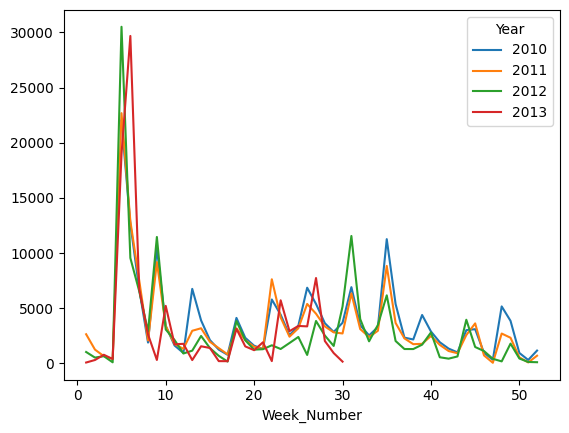

In [29]:
markdown4 = pd.pivot_table(df, values = "MarkDown4", columns = "Year", index = "Week_Number")
markdown4.plot()

<Axes: xlabel='Week_Number'>

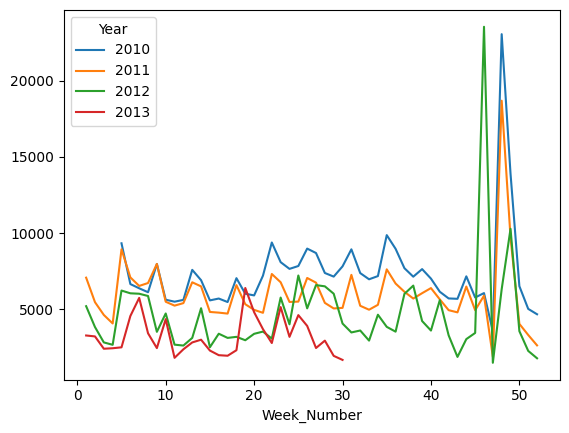

In [30]:
markdown5 = pd.pivot_table(df, values = "MarkDown5", columns = "Year", index = "Week_Number")
markdown5.plot()

<Axes: xlabel='Fuel_Price'>

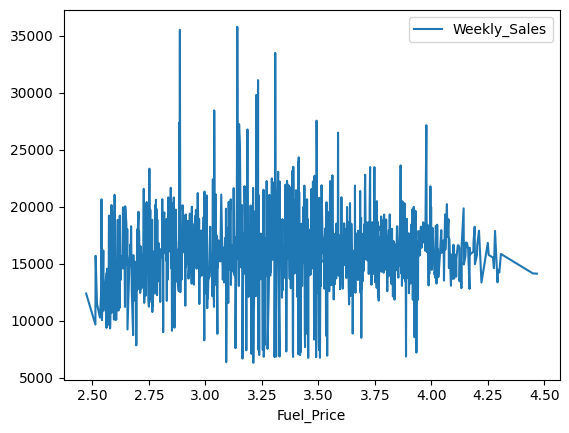

In [33]:
fuel_price = pd.pivot_table(df, values = "Weekly_Sales", index= "Fuel_Price")
fuel_price.plot()

<Axes: xlabel='CPI'>

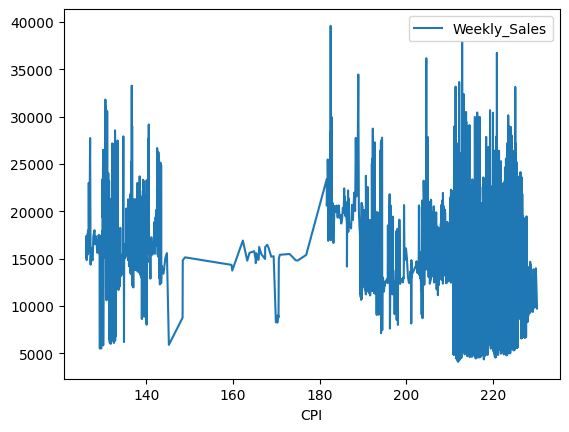

In [34]:
CPI = pd.pivot_table(df, values = "Weekly_Sales", index= "CPI")
CPI.plot()

<Axes: xlabel='Unemployment'>

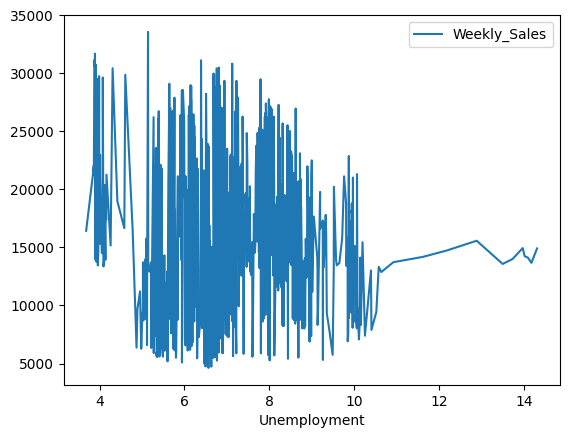

In [35]:
unemp = pd.pivot_table(df, values = "Weekly_Sales", index= "Unemployment")
unemp.plot()

## Insights

* Total there are 45 stores and 81 departments in the data provided.

* A, B and C are the three types of stores according to the area. By the type the sales vary accordingly.

* On an average dept 92 and 95 has higher volume in sales compared to the other.

* Store 20 and 4 has higher sales volume which we can say b y the means of seasonal demands.

* Novemner and December months have the highest sale on average, so that the January seeks a drop in sales.

* Week 47 & 51 has the highest sales in a year, which shows that the sales during thanksgiving and Christmas are much higher than other weeks.

* Fuel price, CPI and Unemployment has no pattern on the weekly sales. 